# Crimes in Boston Analysis

## **1. Context**

### **1.1 Background**

According to Cornell Law School, "Crime is behavior, either by act or omission, defined by statutory or common law as deserving of punishment or penalty" ([par 2](https://www.law.cornell.edu/wex/crime#:~:text=A%20crime%20is%20behavior%20that,common%20law%20still%20carries%20force.)). This means any action, whether intentional or not, that is defined by law as an act worthy of punishment or sanction. Although generally, this law violation requires the intention of the perpetrator, there are minor legal violations that occur without the intention of the person doing it, such as parking violations. Violating the law is categorized as a major violation of public order (crime/felony) or a lesser offense (misdemeanor) and will be prosecuted according to the applicable procedure.

In America, calling the police 911 (contact center) is very common. In addition to following up on complaints, police in America usually have a patrol schedule to anticipate violations of the law. Generally, eyewitnesses will call 911. 911 or dispatcher will record the report on the form on the computer at the same time while the reporter is still connected to him. If it is felt that there is an "emergency" that needs to be handled quickly and immediately (for example, as someone who is about to do something that endangers himself and/or other people around him or reports about a robbery that is happening) usually the dispatcher will immediately send information to the police and paramedics (if there is an emergency) right away to visit the crime scene. This information is usually about what happened and where it happened. The police and paramedics immediately received the report and followed up on report right away. After completing the case, the police are required to report all matters related to the incident.

With the police and the rapid reporting and action described above, it does not mean that there is no lawlessness in America. A person breaking the law is not always because of revenge or because there are things to be fulfilled (economic pressure or other needs), but it can also be due to negligence, depending on the background of the perpetrator. So we can be concluded that law violations cannot be eliminated, but can be prevented by preventive actions from law enforcement.

### **1.2 Problem Formulation**

Taken from the [City of Boston](https://www.boston.gov/departments/police)"s website, "The Boston Police Department is dedicated to working in partnership with the community to fight crime. We work to improve the quality of life in our neighborhoods". Boston PD works with the community to help each other to create a better quality of life. **The Boston Police are committed to reducing crime rates** in their area.

"The executive head of the department" of Boston PD, in this case, the police commissioner, together with high-ranking officials of Boston PD want to evaluate the incidence of major and minor violations of the law that occurred in the Boston area, Massachusetts, USA, from June 2015 to September 2018 to get "insight", so that the services provided to the people of Boston can be improved and the commitment to creating a better quality of life in Boston can be realized. As a "criminology consultant", I will answer the question **whether the lawlessness in Boston has been successfully suppressed** with the following formulation of the problem.

**What is the trend of lawlessness in Boston?**

Later, we will discuss the types of law violations that occur the most, the times when violations of the law generally occur, and the locations with the highest level of violations. Has the presence of Boston PD helped reduce lawlessness? What recommendations can be given so  Boston PD can provide a greater sense of security to the people of Boston?

## **2. Data**

### **Data Preparation**

The dataset is obtained from Kaggle and can also be retrieved directly from Boston Analyze"s website. Data provided by the Boston Police Department (BPD). The dataset can be accessed [on Kaggle](https://www.kaggle.com/datasets/AnalyzeBoston/crimes-in-boston) and the [Analyze Boston](https://data.boston.gov/dataset/crime-incident-reports-august-2015-to-date-source-new-system)"s website.

In [1]:
import pandas as pd 
import numpy as np
import geopandas as gpd
import math

import matplotlib as mpl
import matplotlib.pyplot as plt 
%matplotlib inline

import seaborn as sns

import folium
from folium import Choropleth, Circle, Marker, Map
from folium.plugins import HeatMap, MarkerCluster

import plotly.express as px
import plotly.graph_objects as go

import warnings
warnings.filterwarnings("ignore")

### Data of Crimes in Boston

In [2]:
df_crime = pd.read_csv("crime.csv", encoding="latin1")
df_crime.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"


### Offense Codes

In [3]:
df_code = pd.read_csv("offense_codes.csv", encoding="latin1")
df_code

,CODE,NAME
0,612,LARCENY PURSE SNATCH - NO FORCE
1,613,LARCENY SHOPLIFTING
2,615,LARCENY THEFT OF MV PARTS & ACCESSORIES
3,1731,INCEST
4,3111,LICENSE PREMISE VIOLATION
...,...,...
571,1806,DRUGS - CLASS B TRAFFICKING OVER 18 GRAMS
572,1807,DRUGS - CLASS D TRAFFICKING OVER 50 GRAMS
573,1610,HUMAN TRAFFICKING - COMMERCIAL SEX ACTS
574,2010,HOME INVASION


### Copy Data

Copy the data so the original data is not disturbed

In [4]:
crime_copy = df_crime.copy()
crime_copy.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"


In [5]:
offense_code_copy = df_code.copy()
offense_code_copy.head()

,CODE,NAME
0,612,LARCENY PURSE SNATCH - NO FORCE
1,613,LARCENY SHOPLIFTING
2,615,LARCENY THEFT OF MV PARTS & ACCESSORIES
3,1731,INCEST
4,3111,LICENSE PREMISE VIOLATION


## **3. Data Understanding and Cleaning**

### **3.1 Data Understanding**

Before entering into the analysis, it is necessary to carry out the "Data Understanding" stage to find out the anomalies in the dataset that will be handled in the "data cleaning" stage. Each anomaly handling will be accompanied by a justification of the steps to be taken, both "domain knowledge" and statistically.

**List of column names in the data**

In [6]:
for col in crime_copy.columns:
    print(col)

INCIDENT_NUMBER
OFFENSE_CODE
OFFENSE_CODE_GROUP
OFFENSE_DESCRIPTION
DISTRICT
REPORTING_AREA
SHOOTING
OCCURRED_ON_DATE
YEAR
MONTH
DAY_OF_WEEK
HOUR
UCR_PART
STREET
Lat
Long
Location


The Crimes in Boston dataset contains information about the time, location, and crime/lawlessness that occurred. An explanation of each column is obtained from [Analyze Boston](https://data.boston.gov/dataset/crime-incident-reports-august-2015-to-date-source-new-system/resource/9c30453a-fefa-4fe0-b51a-5fc09b0f4655).

In [7]:
field_explanation = pd.read_excel("rmscrimeincidentfieldexplanation.xlsx")
field_explanation

,"Field Name, Data Type, Required",Description
0,"[incident_num] [varchar](20) NOT NULL,",Internal BPD report number
1,"[offense_code][varchar](25) NULL,",Numerical code of offense description
2,[Offense_Code_Group_Description][varchar](80) ...,Internal categorization of [offense_description]
3,"[Offense_Description][varchar](80) NULL,",Primary descriptor of incident
4,"[district] [varchar](10) NULL,",What district the crime was reported in
5,"[reporting_area] [varchar](10) NULL,",RA number associated with the where the crime ...
6,"[shooting][char] (1) NULL,",Indicated a shooting took place.
7,"[occurred_on] [datetime2](7) NULL,",Earliest date and time the incident could have...
8,"[UCR_Part] [varchar](25) NULL,","Universal Crime Reporting Part number (1,2, 3)"
9,"[street] [varchar](50) NULL,",Street name the incident took place


In the `df_crime` table, there are `Year`, `Month`, `Day`, and `Hour` columns which are details of the time of the incident as contained in the `OCCURRED_ON_DATE` column. In addition, there are also `Lat` and `Long` columns which are the contents of the `Location` column.

Let"s unify the column names by renaming each column

In [8]:
data_crime = crime_copy.rename(columns= {
                    "INCIDENT_NUMBER": "Incident_ID",
                    "OFFENSE_CODE":"Offense_Code",
                    "OFFENSE_CODE_GROUP":"Offense_Code_Group",
                    "OFFENSE_DESCRIPTION": "Offense_Description",
                    "DISTRICT": "District",
                    "REPORTING_AREA":"Reporting_Area",
                    "SHOOTING":"Shooting",
                    "OCCURRED_ON_DATE":"Occurred_On",
                    "YEAR":"Year",
                    "MONTH":"Month",
                    "DAY_OF_WEEK":"Day",
                    "HOUR":"Hour",
                    "UCR_PART":"UCR",
                    "STREET":"Street",
                    "Lat":"Latitude",
                    "Long":"Longitude"})

In [9]:
offense_code = offense_code_copy.rename(columns= {
                    "CODE": "Offense_Code",
                    "NAME":"Name"})

New dataset are below:

In [10]:
data_crime.head()

,Incident_ID,Offense_Code,Offense_Code_Group,Offense_Description,District,Reporting_Area,Shooting,Occurred_On,Year,Month,Day,Hour,UCR,Street,Latitude,Longitude,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"


In [11]:
offense_code

,Offense_Code,Name
0,612,LARCENY PURSE SNATCH - NO FORCE
1,613,LARCENY SHOPLIFTING
2,615,LARCENY THEFT OF MV PARTS & ACCESSORIES
3,1731,INCEST
4,3111,LICENSE PREMISE VIOLATION
...,...,...
571,1806,DRUGS - CLASS B TRAFFICKING OVER 18 GRAMS
572,1807,DRUGS - CLASS D TRAFFICKING OVER 50 GRAMS
573,1610,HUMAN TRAFFICKING - COMMERCIAL SEX ACTS
574,2010,HOME INVASION


Now look at the general information of the `data_crime` dataset.

In [12]:
data_crime.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319073 entries, 0 to 319072
Data columns (total 17 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   Incident_ID          319073 non-null  object 
 1   Offense_Code         319073 non-null  int64  
 2   Offense_Code_Group   319073 non-null  object 
 3   Offense_Description  319073 non-null  object 
 4   District             317308 non-null  object 
 5   Reporting_Area       319073 non-null  object 
 6   Shooting             1019 non-null    object 
 7   Occurred_On          319073 non-null  object 
 8   Year                 319073 non-null  int64  
 9   Month                319073 non-null  int64  
 10  Day                  319073 non-null  object 
 11  Hour                 319073 non-null  int64  
 12  UCR                  318983 non-null  object 
 13  Street               308202 non-null  object 
 14  Latitude             299074 non-null  float64
 15  Longitude        

There are 319073 rows and 17 columns

In [13]:
pd.set_option("display.max_colwidth", -1)

listItem = []
for col in data_crime.columns :
    listItem.append( [col, data_crime[col].nunique(), data_crime[col].unique()])

tabel1Desc = pd.DataFrame(columns=["Column Name", "Number of Unique", "Unique Sample"],
                     data=listItem)
tabel1Desc

,Column Name,Number of Unique,Unique Sample
0,Incident_ID,282517,"[I182070945, I182070943, I182070941, I182070940, I182070938, I182070936, I182070933, I182070932, I182070931, I182070929, I182070928, I182070927, I182070923, I182070922, I182070921, I182070920, I182070919, I182070918, I182070917, I182070915, I182070913, I182070911, I182070910, I182070909, I182070908, I182070906, I182070905, I182070904, I182070903, I182070901, I182070900, I182070898, I182070897, I182070895, I182070893, I182070892, I182070891, I182070890, I182070889, I182070888, I182070887, I182070886, I182070885, I182070882, I182070881, I182070880, I182070879, I182070877, I182070876, I182070875, I182070874, I182070873, I182070872, I182070871, I182070870, I182070868, I182070866, I182070865, I182070863, I182070862, I182070861, I182070860, I182070859, I182070858, I182070857, I182070856, I182070855, I182070854, I182070852, I182070851, I182070850, I182070849, I182070847, I182070846, I182070844, I182070843, I182070842, I182070841, I182070840, I182070839, I182070838, I182070837, I182070836, I182070835, I182070834, I182070833, I182070832, I182070831, I182070830, I182070829, I182070828, I182070827, I182070826, I182070825, I182070824, I182070823, I182070822, I182070820, I182070819, I182070818, ...]"
1,Offense_Code,222,"[619, 1402, 3410, 3114, 3820, 724, 3301, 301, 3108, 2647, 3201, 3006, 3305, 614, 3801, 3803, 522, 3831, 802, 2007, 2900, 2907, 2629, 2662, 3207, 613, 3109, 2612, 1843, 3125, 1841, 3802, 3018, 2405, 617, 3625, 3106, 3501, 3115, 616, 3807, 1102, 1849, 2905, 1810, 1842, 1806, 1848, 1844, 423, 3205, 413, 1501, 3001, 3830, 561, 2914, 2610, 1109, 706, 2403, 3160, 900, 801, 3002, 520, 2648, 670, 615, 3116, 1504, 1830, 361, 2006, 311, 1001, 3810, 2401, 2646, 3821, 3811, 3007, 2660, 1831, 3119, 3170, 1874, 3112, 3502, 735, 612, 560, 381, 3402, 1815, 1107, 2101, 1106, 3202, 1503, ...]"
2,Offense_Code_Group,67,"[Larceny, Vandalism, Towed, Investigate Property, Motor Vehicle Accident Response, Auto Theft, Verbal Disputes, Robbery, Fire Related Reports, Other, Property Lost, Medical Assistance, Assembly or Gathering Violations, Larceny From Motor Vehicle, Residential Burglary, Simple Assault, Restraining Order Violations, Violations, Harassment, Ballistics, Property Found, Police Service Incidents, Drug Violation, Warrant Arrests, Disorderly Conduct, Property Related Damage, Missing Person Reported, Investigate Person, Fraud, Aggravated Assault, License Plate Related Incidents, Firearm Violations, Other Burglary, Arson, Bomb Hoax, Harbor Related Incidents, Counterfeiting, Liquor Violation, Firearm Discovery, Landlord/Tenant Disputes, Missing Person Located, Auto Theft Recovery, Service, Operating Under the Influence, Confidence Games, Search Warrants, License Violation, Commercial Burglary, HOME INVASION, Recovered Stolen Property, Offenses Against Child / Family, Prostitution, Evading Fare, Prisoner Related Incidents, Homicide, Embezzlement, Explosives, Criminal Harassment, Phone Call Complaints, Aircraft, Biological Threat, Manslaughter, Gambling, INVESTIGATE PERSON, HUMAN TRAFFICKING, HUMAN TRAFFICKING - INVOLUNTARY SERVITUDE, Burglary - No Property Taken]"
3,Offense_Description,244,"[LARCENY ALL OTHERS, VANDALISM, TOWED MOTOR VEHICLE, INVESTIGATE PROPERTY, M/V ACCIDENT INVOLVING PEDESTRIAN - INJURY, AUTO THEFT, VERBAL DISPUTE, ROBBERY - STREET, FIRE REPORT - HOUSE, BUILDING, ETC., THREATS TO DO BODILY HARM, PROPERTY - LOST, SICK/INJURED/MEDICAL - PERSON, DEMONSTRATIONS/RIOT, LARCENY THEFT FROM MV - NON-ACCESSORY, M/V ACCIDENT - OTHER, M/V ACCIDENT - PERSONAL INJURY, BURGLARY - RESIDENTIAL - NO FORCE, M/V - LEAVING SCENE - PROPERTY DAMAGE, ASSAULT SIMPLE - BATTERY, VIOL. OF RESTRAINING ORDER W NO ARREST, VAL - VIOLATION OF AUTO LAW - OTHER, VAL - OPERATING AFTER REV/SUSP., HARASSMENT, BALLISTICS EVIDENCE/FOUND, PROPERTY - FOUND, LARCENY SHOPLIFTING, SERVICE TO OTHER PD INSIDE OF MA., FIRE REPORT/ALARM - FALSE, DRUGS - POSS CLASS B - INTENT TO MFR DIST DISP, WARRANT ARR

**Attributes Information**

| **Attribute** | **Data Type** | **Description** |
| --- | --- | --- |
| Incident_ID | Object | Incident ID |
| Offense_Code | Integer |Offense Code |
| Offense_Code_Group | Object | Group of Offense Description |
| District | Object | Code of District |
| Reporting_Area | Object | Code of Reporting Area |
| Shooting | Object | Shooting or Not |
| Occurred_On | Object | Time offense occured |
| Year | Integer | Year offense occured |
| Month | Integer | Month offense occured |
| Day | Object | Day offense occured |
| Hour | Integer | Hour offense occured |
| UCR | Object | Law violation"s classification |
| Street | Object | Street offense occured |
| Latitude | Float | Latitude |
| Longitude | Float | Longitude |
| Location | Object | Latitude and Longitude |

### **3.2 Data Cleaning**

#### **3.2.1 Check Duplicate Data**

In [14]:
print("There are", data_crime.duplicated().sum(), "data duplicated")

There are 23 data duplicated


Let"s see all of them

In [15]:
duplicated = data_crime[data_crime.duplicated()].sort_values("Incident_ID", ascending=True)
duplicated

,Incident_ID,Offense_Code,Offense_Code_Group,Offense_Description,District,Reporting_Area,Shooting,Occurred_On,Year,Month,Day,Hour,UCR,Street,Latitude,Longitude,Location
319060,I090321958-00,3125,Warrant Arrests,WARRANT ARREST,C11,355,NaN,2016-02-01 01:43:00,2016,2,Monday,1,Part Three,GENEVA AVE,NaN,NaN,"(0.00000000, 0.00000000)"
319051,I110177502-00,3125,Warrant Arrests,WARRANT ARREST,B2,318,NaN,2015-10-02 21:00:00,2015,10,Friday,21,Part Three,HOMESTEAD ST,42.311277,-71.089093,"(42.31127726, -71.08909334)"
319024,I120470733-00,724,Auto Theft,AUTO THEFT,C6,205,NaN,2016-09-23 19:15:00,2016,9,Friday,19,Part One,A ST,42.346953,-71.051127,"(42.34695268, -71.05112684)"
319009,I130041200-00,3125,Warrant Arrests,WARRANT ARREST,B3,428,NaN,2015-12-07 11:38:00,2015,12,Monday,11,Part Three,DIXWELL ST,42.314334,-71.097914,"(42.31433402, -71.09791405)"
318991,I130202615-00,3125,Warrant Arrests,WARRANT ARREST,B2,587,NaN,2015-08-03 17:23:00,2015,8,Monday,17,Part Three,BURNEY ST,42.331496,-71.099791,"(42.33149596, -71.09979111)"
318978,I130371627-00,3125,Warrant Arrests,WARRANT ARREST,B2,318,NaN,2015-10-02 21:00:00,2015,10,Friday,21,Part Three,HOMESTEAD ST,42.311277,-71.089093,"(42.31127726, -71.08909334)"
318961,I130731947-00,2610,Other,TRESPASSING,D4,172,NaN,2015-07-22 22:00:00,2015,7,Wednesday,22,Part Two,MASSACHUSETTS AVE,42.333391,-71.073120,"(42.33339068, -71.07312006)"
318951,I140036361-00,3125,Warrant Arrests,WARRANT ARREST,E5,680,NaN,2015-07-10 10:15:00,2015,7,Friday,10,Part Three,CORINTH ST,42.286369,-71.130055,"(42.28636893, -71.13005503)"
318946,I140039570-00,3125,Warrant Arrests,WARRANT ARREST,A1,103,NaN,2015-09-28 11:15:00,2015,9,Monday,11,Part Three,WASHINGTON ST,42.356486,-71.059281,"(42.35648631, -71.05928145)"
318940,I140056633-00,3125,Warrant Arrests,WARRANT ARREST,A1,64,NaN,2015-06-16 15:55:00,2015,6,Tuesday,15,Part Three,FRUIT ST,42.362403,-71.069547,"(42.36240281, -71.06954652)"


After checking one by one using `Incident_ID`, i"ll drop all of the duplicated data.

In [16]:
crime = data_crime.drop_duplicates()
crime.head()

,Incident_ID,Offense_Code,Offense_Code_Group,Offense_Description,District,Reporting_Area,Shooting,Occurred_On,Year,Month,Day,Hour,UCR,Street,Latitude,Longitude,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"


#### **3.2.2 Check Missing Value**

In [17]:
data_crime.isna().sum()

Incident_ID            0     
Offense_Code           0     
Offense_Code_Group     0     
Offense_Description    0     
District               1765  
Reporting_Area         0     
Shooting               318054
Occurred_On            0     
Year                   0     
Month                  0     
Day                    0     
Hour                   0     
UCR                    90    
Street                 10871 
Latitude               19999 
Longitude              19999 
Location               0     
dtype: int64

There are 6 missing value columns, namely columns `District`, `Shooting`, `UCR`, `Street`, `Latitude`, and `Longitude`. Now I"ll plot using Heatmap so we can see the missing value clearly.

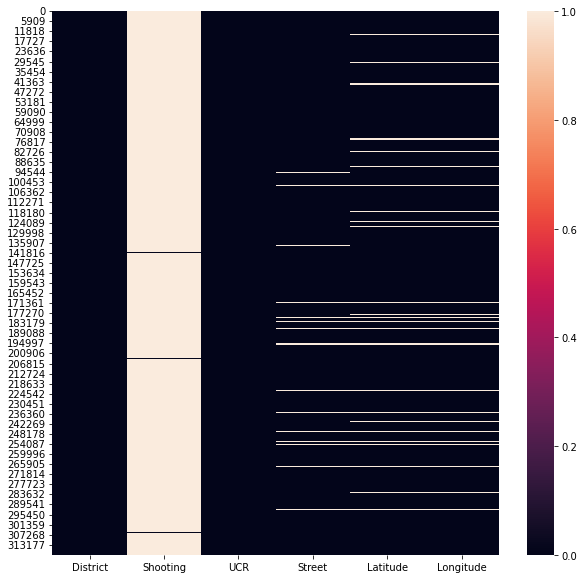

In [18]:
plt.figure(figsize=(10,10))
sns.heatmap(data_crime[["District", "Shooting", "UCR", "Street", "Latitude", "Longitude"]].isna())
plt.show()

I"ll treat every column that has a missing value based on the order of the columns.

##### **3.2.2.1 Handling `District` Column**

In Data Attribute about `District` column, we know that the contents of the column are code. So we need change that code into real name of the district from [Live Boston 617](https://liveboston617.org/2021/07/01/boston-police-departments-bureaus-terms-slang-radio-codes-and-everything-in-between/).

In [19]:
district = crime.value_counts("District", ascending=True)
district

District
A15    6505 
E5     13238
A7     13544
E18    17347
E13    17534
D14    20127
C6     23457
B3     35441
A1     35710
D4     41914
C11    42528
B2     49940
dtype: int64

In [20]:
crime.District.replace({"A1" : "Downtown",
"A15": "Charlestown",
"A7": "East Boston",
"B2": "Roxbury",
"B3": "Mattapan",
"C6": "South Boston",
"C11": "Dorchester",
"D4": "South End",
"D14": "Allston & Brighton",
"E5": "West Roxbury & Roslindale",
"E13": "Jamaica Plain",
"E13": "Hyde Park"}, inplace=True)

In [21]:
print("There are",round(1765/317285 * 100,2), "% District missing value from Data")

There are 0.56 % District missing value from Data


We can drop the missing value because it only under 1%.

In [22]:
crime.dropna(subset = ["District"], inplace=True)

In [23]:
crime.District.isna().sum()

0

##### **3.2.2.2 Handling `Shooting` Column**

In [24]:
crime.value_counts("Shooting")

Shooting
Y    1017
dtype: int64

From the output above, there is only one "Y" value with 1019 data in the `Shooting` column. This means only 1019 incidents involving firearms, while in other cases there is no data / NaN (missing value). I will change the missing value to no firearms involved (N) with the consideration that shooting can result in the injury/death of another person, either intentionally (capital murder and nonnegligent manslaughter) or unintentionally (manslaughter by Negligence). For your information, these two things in the United States are part of UCR Part I or "serious crimes". So any case involving firearms in the United States becomes one of the major crimes or serious crimes that are "likely to be reported" (source: [FBI](https://ucr.fbi.gov/crime-in-the-u.s/2011/crime-in-the-u.s.-2011/offense-definitions)). Therefore, if Boston PD does not fill in the `Shooting` column, it can be said that there are no firearms involved.

In [25]:
crime["Shooting"].fillna(value="N", inplace=True)
crime.value_counts("Shooting")

Shooting
N    316268
Y    1017  
dtype: int64

In [26]:
crime.Shooting.isna().sum()

0

##### **3.2.2.3 Handling `UCR` Column**

The next thing to do is to analyze the UCR column. According to the [Uniform Crime Reporting Handbook] produced by the U.S. Dept. of Justice, Federal Bureau of Investigation (p 8), UCR is divided into two categories, namely UCR Part I and UCR Part II. UCR Part I consists of the following 8 classifications of serious/serious legal violations.
1. Criminal Homicide
2. Forcible Rape
3. Robbery
4. Aggravated Assault
5. Burglary
6. Larceny-theft (except motor vehicle theft)
7. Motor Vehicle Theft
8. Arson

UCR Part II includes all other reportable classifications beyond those defined as UCR Part I.
1. Other Assaults
2. Forgery and Counterfeiting
3. Fraud
4. Embezzlement
5. Stolen Property: Buying, Receiving, Possessing
6. Vandalism

Let"s see the `UCR` column

In [27]:
crime.value_counts("UCR")

UCR
Part Three    157515
Part Two      97049 
Part One      61410 
Other         1221  
dtype: int64

It turned out that Boston PD divided UCR into four categories, namely **Part One**, **Part Two**, **Part Three**, and **Other**. There is no other information found from reliable sources that can explain these four categories, so it needs to be investigated further.

**Part One**

In [28]:
crime[crime["UCR"] == "Part One"].value_counts("Offense_Code_Group")

Offense_Code_Group
Larceny                       25861
Larceny From Motor Vehicle    10787
Aggravated Assault            7777 
Residential Burglary          5601 
Auto Theft                    4824 
Robbery                       4605 
Commercial Burglary           1334 
Other Burglary                460  
Homicide                      161  
dtype: int64

**Part Two**

In [29]:
crime[crime["UCR"] == "Part Two"].value_counts("Offense_Code_Group")

Offense_Code_Group
Other                              17009
Drug Violation                     16382
Simple Assault                     15782
Vandalism                          15363
Violations                         6026 
Fraud                              5789 
Harassment                         3997 
Confidence Games                   3140 
Disorderly Conduct                 2605 
Firearm Violations                 1770 
Restraining Order Violations       1604 
Counterfeiting                     1452 
Recovered Stolen Property          1449 
Liquor Violation                   1038 
Ballistics                         976  
Operating Under the Influence      571  
Offenses Against Child / Family    545  
Evading Fare                       407  
Embezzlement                       296  
Prisoner Related Incidents         226  
Prostitution                       205  
Criminal Harassment                131  
Fire Related Reports               126  
Bomb Hoax                          75 

We can see from the two lists above (UCR Part One and UCR Part Two), violation of the law are generally the same as those determined by the FBI, although there are different definitions/names from the FBI. Therefore, it is assumed that Part One and Part Two are correct. Now, look at the contents of Part Three and Other.

**Part Three**

In [30]:
crime[crime["UCR"] == "Part Three"].value_counts("Offense_Code_Group")

Offense_Code_Group
Motor Vehicle Accident Response     36654
Medical Assistance                  23475
Investigate Person                  18676
Verbal Disputes                     13087
Towed                               11224
Investigate Property                11039
Property Lost                       9706 
Warrant Arrests                     8329 
Missing Person Located              4955 
Property Found                      3909 
Missing Person Reported             3760 
Police Service Incidents            2758 
Fire Related Reports                1787 
License Violation                   1695 
Other                               971  
Landlord/Tenant Disputes            966  
Search Warrants                     963  
Assembly or Gathering Violations    951  
Property Related Damage             907  
Firearm Discovery                   698  
License Plate Related Incidents     491  
Service                             283  
Harbor Related Incidents            160  
Aircraft       

In [31]:
crime[crime["UCR"] == "Part Three"].value_counts("Offense_Code_Group").count()

26

In [32]:
crime[crime["UCR"] == "Part Three"].value_counts("Offense_Description")

Offense_Description
SICK/INJURED/MEDICAL - PERSON                      18737
INVESTIGATE PERSON                                 18676
M/V - LEAVING SCENE - PROPERTY DAMAGE              16152
VERBAL DISPUTE                                     13087
TOWED MOTOR VEHICLE                                11224
INVESTIGATE PROPERTY                               11039
PROPERTY - LOST                                    8850 
WARRANT ARREST                                     8329 
M/V ACCIDENT - PROPERTY  DAMAGE                    6477 
M/V ACCIDENT - PERSONAL INJURY                     5043 
MISSING PERSON - LOCATED                           4363 
MISSING PERSON                                     3760 
PROPERTY - FOUND                                   3682 
M/V ACCIDENT - OTHER                               2873 
SERVICE TO OTHER PD INSIDE OF MA.                  2538 
LICENSE PREMISE VIOLATION                          1695 
M/V ACCIDENT INVOLVING PEDESTRIAN - INJURY         1634 
SICK/INJURE

In [33]:
crime[crime["UCR"] == "Part Three"].value_counts("Offense_Description").count()

56

Part Three has 158537 cases consisting of 26 groups of offenses with a total of 56 different types of offenses. If you look at the details of the `Offense_Description`, Part Three are other milder cases (E.g. Verbal Dispute, Towed Motor Vehicle, and License Premise Violation) and cases that are more focused on helping others (E.g. Sick/Injured/Medical - Person, Death Investigation, Missing Person, and Service to Other PD Inside of MA). Therefore, Part Three will be left even if it is not in the UCR category according to the FBI.

**Other**

In [34]:
crime[crime["UCR"] == "Other"]["Offense_Code_Group"].value_counts()

Auto Theft Recovery                1041
Arson                              94  
License Plate Related Incidents    66  
Other                              10  
Manslaughter                       8   
Burglary - No Property Taken       2   
Name: Offense_Code_Group, dtype: int64

When viewed one by one, the six values in the `Offense_Code_Group` column resemble the violations found in UCR Part One, Part Two, and Part Three. No data/documentation was found explaining UCR Other so the six Offense_Code_Group values will be re-categorized.

In [35]:
crime[crime["UCR"] == "Other"].value_counts("Offense_Description")

Offense_Description
RECOVERED - MV RECOVERED IN BOSTON (STOLEN OUTSIDE BOSTON)    1040
ARSON                                                         94  
RECOVERED STOLEN PLATE                                        66  
PROPERTY - CONCEALING LEASED                                  10  
MANSLAUGHTER - VEHICLE - NEGLIGENCE                           5   
MANSLAUGHTER - NON-VEHICLE - NEGLIGENCE                       2   
AUTO THEFT - OUTSIDE - RECOVERED IN BOSTON                    1   
B&E NON-RESIDENCE DAY - NO PROP TAKEN                         1   
B&E RESIDENCE DAY - NO PROP TAKEN                             1   
KILLING OF FELON BY POLICE                                    1   
dtype: int64

**Auto Theft Recovery**

In [36]:
crime[crime["UCR"] == "Other"][crime["Offense_Code_Group"] == "Auto Theft Recovery"].value_counts("Offense_Description")

Offense_Description
RECOVERED - MV RECOVERED IN BOSTON (STOLEN OUTSIDE BOSTON)    1040
AUTO THEFT - OUTSIDE - RECOVERED IN BOSTON                    1   
dtype: int64

Auto Theft Recovery is any vehicle that was stolen, but has been returned ([source](https://www.lvmpd.com/en-us/Pages/AutoTheftRecovery.aspx)). Therefore, *Auto Theft Recovery* is assumed to be part of the Recovered Stolen Property.

New category: UCR Part Two

In [37]:
crime["UCR_Updated"] = np.where((crime["UCR"] == "Other") & (crime["Offense_Code_Group"] == "Auto Theft Recovery"), "Part Two", crime["UCR"])

In [38]:
# Make sure it already updated
crime[crime["UCR_Updated"] == "Part Two"][crime["Offense_Code_Group"] == "Auto Theft Recovery"].value_counts("Offense_Description")

Offense_Description
RECOVERED - MV RECOVERED IN BOSTON (STOLEN OUTSIDE BOSTON)    1040
AUTO THEFT - OUTSIDE - RECOVERED IN BOSTON                    1   
dtype: int64

**Arson**

In [39]:
crime[crime["UCR"] == "Other"][crime["Offense_Code_Group"] == "Arson"].value_counts("Offense_Description")

Offense_Description
ARSON    94
dtype: int64

According to the FBI, Arson became part of UCR Part One.

New Category: UCR Part One

In [40]:
crime["UCR_Updated"] = np.where((crime["UCR"] == "Other") & (crime["Offense_Code_Group"] == "Arson"), "Part One", crime["UCR_Updated"])

In [41]:
# Make sure it already updated
crime[crime["UCR_Updated"] == "Part One"][crime["Offense_Code_Group"] == "Arson"].value_counts("Offense_Description")

Offense_Description
ARSON    94
dtype: int64

**License Plate Related Incidents**

In [42]:
crime[crime["UCR"] == "Other"][crime["Offense_Code_Group"] == "License Plate Related Incidents"].value_counts("Offense_Description")

Offense_Description
RECOVERED STOLEN PLATE    66
dtype: int64

There are *License Plate Related Incidents* in UCR *Part Three*.

New Category: UCR *Part Three*

In [43]:
crime["UCR_Updated"] = np.where((crime["UCR"] == "Other") & (crime["Offense_Code_Group"] == "License Plate Related Incidents"), "Part Three", crime["UCR_Updated"])

In [44]:
# Make sure it already updated
crime[crime["UCR_Updated"] == "Part Three"][crime["Offense_Code_Group"] == "License Plate Related Incidents"].value_counts("Offense_Description")

Offense_Description
M/V PLATES - LOST         491
RECOVERED STOLEN PLATE    66 
dtype: int64

**Other**

In [45]:
crime[crime["UCR"] == "Other"][crime["Offense_Code_Group"] == "Other"].value_counts("Offense_Description")

Offense_Description
PROPERTY - CONCEALING LEASED    10
dtype: int64

The General Court of the Commonwealth of Massachusetts ([source](https://malegislature.gov/laws/generallaws/partiv/titlei/chapter266/section87)) said "Any person leasing or renting personal property who, with the intent to place such property beyond the control of the owner, conceals or aids or abets the concealment of such property or any part thereof, or fails or refuses to return such property to the owner within ten days after expiration of the lease or rental agreement, or sells, conveys or pledges such property or any part thereof without the written consent of the owner, shall be guilty of larceny of leased or rented personal property." This means that Concealing Leased can be assumed to be part of Larceny which is part of UCR Part One.

New Category: UCR Part One

In [46]:
crime["UCR_Updated"] = np.where((crime["UCR"] == "Other") & (crime["Offense_Code_Group"] == "Other"), "Part One", crime["UCR_Updated"])

In [47]:
# Make sure it already updated
crime[crime["UCR_Updated"] == "Part One"][crime["Offense_Code_Group"] == "Other"].value_counts("Offense_Description")

Offense_Description
PROPERTY - CONCEALING LEASED    10
dtype: int64

**Manslaughter**

In [48]:
crime[crime["UCR"] == "Other"][crime["Offense_Code_Group"] == "Manslaughter"].value_counts("Offense_Description")

Offense_Description
MANSLAUGHTER - VEHICLE - NEGLIGENCE        5
MANSLAUGHTER - NON-VEHICLE - NEGLIGENCE    2
KILLING OF FELON BY POLICE                 1
dtype: int64

The three values above can be said to be part of Manslaughter by Negligence or murder that occurs due to accident or negligence, although the last one (Killing of Felon by Police) does not have supporting data that states whether the killing was intentional or not. Manslaughter by Negligence is part of UCR Part One.

New Category: UCR Part One

In [49]:
crime["UCR_Updated"] = np.where((crime["UCR"] == "Other") & (crime["Offense_Code_Group"] == "Manslaughter"), "Part One", crime["UCR_Updated"])

In [50]:
# Make sure it already updated
crime[crime["UCR_Updated"] == "Part One"][crime["Offense_Code_Group"] == "Manslaughter"].value_counts("Offense_Description")

Offense_Description
MANSLAUGHTER - VEHICLE - NEGLIGENCE        5
MANSLAUGHTER - NON-VEHICLE - NEGLIGENCE    2
KILLING OF FELON BY POLICE                 1
dtype: int64

**Burglary - No Property Taken**

In [51]:
crime[crime["UCR"] == "Other"][crime["Offense_Code_Group"] == "Burglary - No Property Taken"].value_counts("Offense_Description")

Offense_Description
B&E NON-RESIDENCE DAY - NO PROP TAKEN    1
B&E RESIDENCE DAY - NO PROP TAKEN        1
dtype: int64

Texas [Penal Code](https://statutes.capitol.texas.gov/Docs/PE/htm/PE.30.htm) Title 7. Offenses Against Property, Chapter 30. Burglary and Criminal Trespass on Sec. 30.02 explains that burglary is a person who violates the law to enter an area or building that is not open to the public without the permission of the owner with the intention of committing a crime. Despite "No Property Taken", the burglary action has already taken place. Therefore, "Burglary - No Property Taken" will be part of UCR Part One.

New Category: UCR Part One

In [52]:
crime["UCR_Updated"] = np.where((crime["UCR"] == "Other") & (crime["Offense_Code_Group"] == "Burglary - No Property Taken"), "Part One", crime["UCR_Updated"])

In [53]:
# Make sure it already updated
crime[crime["UCR_Updated"] == "Part One"][crime["Offense_Code_Group"] == "Burglary - No Property Taken"].value_counts("Offense_Description")

Offense_Description
B&E NON-RESIDENCE DAY - NO PROP TAKEN    1
B&E RESIDENCE DAY - NO PROP TAKEN        1
dtype: int64

Check again the UCR value after `Other` is re-categorized.

In [54]:
crime[crime["UCR"] == "Other"].value_counts("UCR_Updated")

UCR_Updated
Part Two      1041
Part One      114 
Part Three    66  
dtype: int64

Before handling missing value on `UCR` column, the `UCR` column will be removed and the `UCR_Updated` column will be renamed for easy mention.

In [55]:
crime.drop(labels="UCR", axis=1, inplace=True)

In [56]:
crime.rename(columns = {"UCR_Updated":"UCR"}, inplace = True)

In [57]:
crime.UCR.isna().sum()

90

Due to the lack of missing values in the `UCR` column, i will drop it.

In [58]:
crime.dropna(subset=["UCR"],inplace=True)

##### **3.2.2.4 Handling `Street` Column**

I"ll drop this columns because we will use `Location` column for better precision.

In [59]:
crime.drop(columns = "Street", inplace=True)

##### **3.2.2.5 Handling `Latitude` and `Longitude` Columns**

Like I mention before, we will use `Location` column because this column is filled with `Latitude` and `Longitude` columns. So the missing value will be remove.

In [60]:
crime.drop(labels = ["Latitude", "Longitude"], axis = 1, inplace=True)

To make the analysis easier, I still need the latitude and longitude columns. Let"s use `Location` column to get `Latitude` and `Longitude` columns

In [64]:
import re

datacrime = []
for i in crime["Location"]:
    datacrime.append(re.split(",", i))

datacrime[0:5]

[['(42.35779134', ' -71.13937053)'],
 ['(42.30682138', ' -71.06030035)'],
 ['(42.34658879', ' -71.07242943)'],
 ['(42.33418175', ' -71.07866441)'],
 ['(42.27536542', ' -71.09036101)']]

In [65]:
datacrimeloc = pd.DataFrame(data=datacrime)
datacrimeloc

,0,1
0,(42.35779134,-71.13937053)
1,(42.30682138,-71.06030035)
2,(42.34658879,-71.07242943)
3,(42.33418175,-71.07866441)
4,(42.27536542,-71.09036101)
...,...,...
317190,(42.33695098,-71.08574813)
317191,(42.25592648,-71.12317207)
317192,(42.25592648,-71.12317207)
317193,(42.30233307,-71.11156487)


In [66]:
datacrimeloc.rename(columns = {
            0: "Latitude",
            1: "Longitude"}, inplace=True)
datacrimeloc

,Latitude,Longitude
0,(42.35779134,-71.13937053)
1,(42.30682138,-71.06030035)
2,(42.34658879,-71.07242943)
3,(42.33418175,-71.07866441)
4,(42.27536542,-71.09036101)
...,...,...
317190,(42.33695098,-71.08574813)
317191,(42.25592648,-71.12317207)
317192,(42.25592648,-71.12317207)
317193,(42.30233307,-71.11156487)


In [67]:
datacrimeloc["Latitude"] = datacrimeloc["Latitude"].str.replace("(", "")
datacrimeloc["Longitude"] = datacrimeloc["Longitude"].str.replace(")", "")

In [68]:
datacrimeloc

,Latitude,Longitude
0,42.35779134,-71.13937053
1,42.30682138,-71.06030035
2,42.34658879,-71.07242943
3,42.33418175,-71.07866441
4,42.27536542,-71.09036101
...,...,...
317190,42.33695098,-71.08574813
317191,42.25592648,-71.12317207
317192,42.25592648,-71.12317207
317193,42.30233307,-71.11156487


Change the data type to float

In [69]:
datacrimeloc = datacrimeloc.astype(float)

In [70]:
datacrimeloc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 317195 entries, 0 to 317194
Data columns (total 2 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   Latitude   317195 non-null  float64
 1   Longitude  317195 non-null  float64
dtypes: float64(2)
memory usage: 4.8 MB


Sekarangkan gabungkan kolom *datacrimeloc* dengan kolom *crime*.

In [71]:
crime["nothing"] = np.arange(len(crime))
datacrimeloc["nothing"] = np.arange(len(datacrimeloc))

crimes = pd.merge(crime, datacrimeloc, on = ["nothing"])
crimes = crimes.drop("nothing", axis = 1)
crimes.drop(labels="Location", axis=1, inplace=True)

#### **3.2.3 Data Type**

In [72]:
crime.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 317195 entries, 0 to 319072
Data columns (total 15 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   Incident_ID          317195 non-null  object
 1   Offense_Code         317195 non-null  int64 
 2   Offense_Code_Group   317195 non-null  object
 3   Offense_Description  317195 non-null  object
 4   District             317195 non-null  object
 5   Reporting_Area       317195 non-null  object
 6   Shooting             317195 non-null  object
 7   Occurred_On          317195 non-null  object
 8   Year                 317195 non-null  int64 
 9   Month                317195 non-null  int64 
 10  Day                  317195 non-null  object
 11  Hour                 317195 non-null  int64 
 12  Location             317195 non-null  object
 13  UCR                  317195 non-null  object
 14  nothing              317195 non-null  int32 
dtypes: int32(1), int64(4), object(10)


For easier analysis, i will change `Occured_On` column type into datetime and `Month` column using name of month.

Change Occured_On column data type into datetime

In [73]:
crimes["Occurred_On"] = pd.to_datetime(crimes["Occurred_On"])

In [71]:
crimes.Occurred_On.info()

<class 'pandas.core.series.Series'>
Int64Index: 317195 entries, 0 to 317194
Series name: Occurred_On
Non-Null Count   Dtype         
--------------   -----         
317195 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 4.8 MB


Add `Month_Name` column from `Month` column

In [74]:
crimes["Month_Name"] = crimes["Occurred_On"].dt.strftime("%b")

In [75]:
crimes.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 317195 entries, 0 to 317194
Data columns (total 16 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   Incident_ID          317195 non-null  object        
 1   Offense_Code         317195 non-null  int64         
 2   Offense_Code_Group   317195 non-null  object        
 3   Offense_Description  317195 non-null  object        
 4   District             317195 non-null  object        
 5   Reporting_Area       317195 non-null  object        
 6   Shooting             317195 non-null  object        
 7   Occurred_On          317195 non-null  datetime64[ns]
 8   Year                 317195 non-null  int64         
 9   Month                317195 non-null  int64         
 10  Day                  317195 non-null  object        
 11  Hour                 317195 non-null  int64         
 12  UCR                  317195 non-null  object        
 13  Latitude      

In [76]:
pd.set_option("display.max_colwidth", -1)

listItem = []
for col in crimes.columns :
    listItem.append( [col, crimes[col].nunique(), crimes[col].unique()])

tabel1Desc = pd.DataFrame(columns=["Column Name", "Number of Unique", "Unique Sample"],
                     data=listItem)
tabel1Desc

,Column Name,Number of Unique,Unique Sample
0,Incident_ID,280891,"[I182070945, I182070943, I182070941, I182070940, I182070938, I182070936, I182070933, I182070932, I182070931, I182070929, I182070928, I182070927, I182070923, I182070922, I182070921, I182070919, I182070918, I182070917, I182070915, I182070911, I182070910, I182070909, I182070908, I182070905, I182070904, I182070903, I182070901, I182070900, I182070898, I182070897, I182070895, I182070893, I182070892, I182070891, I182070890, I182070888, I182070887, I182070886, I182070885, I182070882, I182070881, I182070880, I182070879, I182070877, I182070876, I182070875, I182070874, I182070873, I182070872, I182070871, I182070870, I182070868, I182070863, I182070862, I182070861, I182070860, I182070859, I182070858, I182070857, I182070856, I182070855, I182070854, I182070852, I182070851, I182070850, I182070849, I182070847, I182070846, I182070844, I182070843, I182070842, I182070841, I182070840, I182070838, I182070837, I182070835, I182070834, I182070833, I182070832, I182070831, I182070830, I182070829, I182070828, I182070827, I182070826, I182070825, I182070824, I182070823, I182070822, I182070819, I182070818, I182070817, I182070816, I182070815, I182070813, I182070812, I182070811, I182070809, I182070808, I182070807, ...]"
1,Offense_Code,219,"[619, 1402, 3410, 3114, 3820, 724, 3301, 301, 3108, 2647, 3201, 3305, 614, 3801, 3006, 3803, 522, 802, 2007, 2900, 2907, 2629, 2662, 3207, 613, 3109, 2612, 3802, 3018, 3831, 2405, 617, 3625, 3106, 3501, 3115, 616, 1102, 1849, 2905, 1810, 1842, 1848, 1844, 423, 3205, 413, 1501, 3001, 3830, 561, 2914, 2610, 1109, 706, 2403, 3160, 900, 3125, 801, 3002, 520, 2648, 670, 615, 1504, 1830, 361, 2006, 1843, 311, 1001, 3810, 2401, 2646, 3821, 3007, 2660, 1831, 3119, 3170, 1874, 3112, 3502, 735, 612, 560, 381, 3402, 1815, 1107, 2101, 1106, 3202, 1503, 3016, 3304, 611, 2622, 3130, ...]"
2,Offense_Code_Group,63,"[Larceny, Vandalism, Towed, Investigate Property, Motor Vehicle Accident Response, Auto Theft, Verbal Disputes, Robbery, Fire Related Reports, Other, Property Lost, Assembly or Gathering Violations, Larceny From Motor Vehicle, Medical Assistance, Residential Burglary, Simple Assault, Restraining Order Violations, Violations, Harassment, Ballistics, Property Found, Police Service Incidents, Disorderly Conduct, Property Related Damage, Missing Person Reported, Investigate Person, Fraud, Drug Violation, Aggravated Assault, License Plate Related Incidents, Firearm Violations, Other Burglary, Arson, Warrant Arrests, Bomb Hoax, Counterfeiting, Liquor Violation, Firearm Discovery, Landlord/Tenant Disputes, Missing Person Located, Auto Theft Recovery, Service, Operating Under the Influence, Confidence Games, Search Warrants, License Violation, Commercial Burglary, Recovered Stolen Property, Offenses Against Child / Family, Prostitution, Harbor Related Incidents, Evading Fare, Prisoner Related Incidents, Homicide, Embezzlement, Explosives, Criminal Harassment, Phone Call Complaints, Aircraft, Biological Threat, Manslaughter, Gambling, Burglary - No Property Taken]"
3,Offense_Description,241,"[LARCENY ALL OTHERS, VANDALISM, TOWED MOTOR VEHICLE, INVESTIGATE PROPERTY, M/V ACCIDENT INVOLVING PEDESTRIAN - INJURY, AUTO THEFT, VERBAL DISPUTE, ROBBERY - STREET, FIRE REPORT - HOUSE, BUILDING, ETC., THREATS TO DO BODILY HARM, PROPERTY - LOST, DEMONSTRATIONS/RIOT, LARCENY THEFT FROM MV - NON-ACCESSORY, M/V ACCIDENT - OTHER, SICK/INJURED/MEDICAL - PERSON, M/V ACCIDENT - PERSONAL INJURY, BURGLARY - RESIDENTIAL - NO FORCE, ASSAULT SIMPLE - BATTERY, VIOL. OF RESTRAINING ORDER W NO ARREST, VAL - VIOLATION OF AUTO LAW - OTHER, VAL - OPERATING AFTER REV/SUSP., HARASSMENT, BALLISTICS EVIDENCE/FOUND, PROPERTY - FOUND, LARCENY SHOPLIFTING, SERVICE TO OTHER PD INSIDE OF MA., FIRE REPORT/ALARM - FALSE, M/V ACCIDENT - PROPERTY DAMAGE, SICK/INJURED/MEDICAL - POLICE, M/V - LEAVING SCENE - PROPERTY DAMAGE, DISORDERLY CONDUCT, LARCENY THEFT FROM BUILDING, DANGEROUS OR HAZARDOUS CONDITION, PROPERTY - 

### **3.3 Clean Data**

**This is the data that has been cleaned**

In [80]:
listItem = []
for col in crimes.columns :
    listItem.append([col, crimes[col].dtype, crimes[col].isna().sum(),
                    crimes[col].nunique(), list(crimes[col].drop_duplicates().sample(2).values)]);

dfDesc = pd.DataFrame(columns=["dataFeatures", "dataType", "null", "unique", "uniqueSample"],
                     data=listItem)
print(crimes.shape)
dfDesc

(317195, 16)


,dataFeatures,dataType,null,unique,uniqueSample
0,Incident_ID,object,0,280891,"[I162099810, I172046031]"
1,Offense_Code,int64,0,219,"[706, 562]"
2,Offense_Code_Group,object,0,63,"[Recovered Stolen Property, Harassment]"
3,Offense_Description,object,0,241,"[PROSTITUTION - ASSISTING OR PROMOTING, PROSTITUTION - SOLICITING]"
4,District,object,0,12,"[West Roxbury & Roslindale, South End]"
5,Reporting_Area,object,0,879,"[713, 342]"
6,Shooting,object,0,2,"[Y, N]"
7,Occurred_On,datetime64[ns],0,232077,"[2015-06-28T18:44:00.000000000, 2017-08-09T14:30:00.000000000]"
8,Year,int64,0,4,"[2016, 2017]"
9,Month,int64,0,12,"[8, 7]"


## **4. Data Analysis**

After the data cleaning process, now I will do an analysis to find out **how is the trend of lawlessness in Boston**.

The analysis will be carried out by comparing the most frequent violations of the law every year when the violations occur the most, and where are the locations where the most frequent violations of the law occur.

In [79]:
crimes.groupby(crimes["Occurred_On"].dt.to_period("M")).count()["Incident_ID"]

Occurred_On
2015-06    4129
2015-07    8308
2015-08    8327
2015-09    8400
2015-10    8290
2015-11    7810
2015-12    7978
2016-01    7831
2016-02    7301
2016-03    8194
2016-04    8092
2016-05    8571
2016-06    8525
2016-07    8477
2016-08    8850
2016-09    8428
2016-10    8508
2016-11    7877
2016-12    7905
2017-01    7960
2017-02    7373
2017-03    8148
2017-04    8042
2017-05    8685
2017-06    8942
2017-07    9002
2017-08    9121
2017-09    8881
2017-10    8772
2017-11    7870
2017-12    7473
2018-01    7724
2018-02    6905
2018-03    7693
2018-04    7859
2018-05    8850
2018-06    8771
2018-07    8461
2018-08    8247
2018-09    615 
Freq: M, Name: Incident_ID, dtype: int64

### **Frequent violations of the law from June 2015 to September 2018**

To find out the most frequent violations, we will compare the violations in `Offense_Code_Group` column.

Text(0.5, 0, 'Number of Offenses')

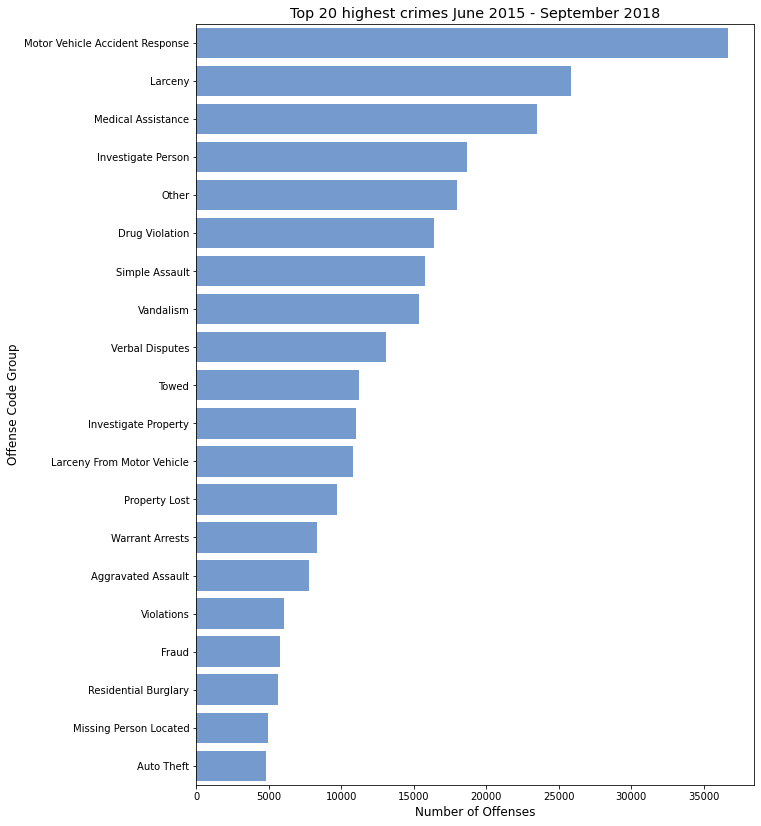

In [110]:
top_20 = crimes["Offense_Code_Group"].value_counts().sort_values(ascending=False).head(20)

plt.figure(figsize=(10,14))
plt.title("Top 20 highest crimes June 2015 - September 2018", size = "x-large")
sns.barplot(x = top_20, y = top_20.index, color='#69d')
plt.xlabel("Number of Offenses", size = "large")
plt.ylabel("Offense Code Group", size = "large")

The graph above shows that the most frequent occurrence is `Motor Vehicle Accident Response` which is a response to a traffic accident.

### Trend law violations per year from 2015 to 2018

In [87]:
df_2015 = crimes.loc[crimes["Year"] == 2015]
value_counts1 = df_2015.Offense_Code_Group.value_counts()
crime_counts1 = pd.DataFrame(value_counts1)
crime_counts1 = crime_counts1.reset_index()
crime_counts1.columns = ["Offense_Code_Group", "2015"]

df_2016 = crimes.loc[crimes["Year"] == 2016]
value_counts2 =  df_2016.Offense_Code_Group.value_counts()
crime_counts2 = pd.DataFrame(value_counts2)
crime_counts2 = crime_counts2.reset_index()
crime_counts2.columns = ["Offense_Code_Group", "2016"]

df_2017 = crimes.loc[crimes["Year"] == 2017]
value_counts3 =  df_2017.Offense_Code_Group.value_counts()
crime_counts3 = pd.DataFrame(value_counts3)
crime_counts3 = crime_counts3.reset_index()
crime_counts3.columns = ["Offense_Code_Group", "2017"]

df_2018 = crimes.loc[crimes["Year"] == 2018]
value_counts4 =  df_2018.Offense_Code_Group.value_counts()
crime_counts4 = pd.DataFrame(value_counts4)
crime_counts4 = crime_counts4.reset_index()
crime_counts4.columns = ["Offense_Code_Group", "2018"]

crime_counts = pd.concat([crime_counts1, crime_counts2, crime_counts3, crime_counts4], axis = 1)

In [88]:
crime_counts

,Offense_Code_Group,2015,Offense_Code_Group,2016,Offense_Code_Group,2017,Offense_Code_Group,2018
0,Motor Vehicle Accident Response,5806.0,Motor Vehicle Accident Response,11409.0,Motor Vehicle Accident Response,11875,Motor Vehicle Accident Response,7564.0
1,Larceny,4999.0,Larceny,7876.0,Larceny,7791,Medical Assistance,5582.0
2,Other,3370.0,Medical Assistance,6969.0,Medical Assistance,7789,Larceny,5195.0
3,Drug Violation,3289.0,Investigate Person,5739.0,Investigate Person,6635,Other,3806.0
4,Medical Assistance,3135.0,Other,5510.0,Other,5304,Investigate Person,3795.0
...,...,...,...,...,...,...,...,...
57,Phone Call Complaints,6.0,Explosives,7.0,Gambling,6,Explosives,7.0
58,Aircraft,4.0,Manslaughter,5.0,Explosives,6,Aircraft,6.0
59,Gambling,2.0,Aircraft,4.0,Phone Call Complaints,4,NaN,NaN
60,Burglary - No Property Taken,1.0,Burglary - No Property Taken,1.0,Manslaughter,3,NaN,NaN


In [89]:
crime_counts.describe()

,2015,2016,2017,2018
count,61.000000,61.000000,62.000000,59.000000
mean,872.819672,1615.721311,1617.241935,1103.813559
std,1235.800099,2306.852467,2397.169729,1598.003652
min,1.000000,1.000000,2.000000,6.000000
25%,89.000000,135.000000,120.250000,100.500000
50%,256.000000,532.000000,459.500000,355.000000
75%,1297.000000,1908.000000,1689.750000,1228.500000
max,5806.000000,11409.000000,11875.000000,7564.000000


The table above is a descriptive statistical value that indicates the distribution of groups of law violations each year. All years have the same pattern and do not have a symmetrical distribution, the mean is higher than the median. So the distribution is skewed to the right.

Here is the graph of the total law violation for each year from 2015 to 2018.

Text(0, 0.5, 'Number of Offenses')

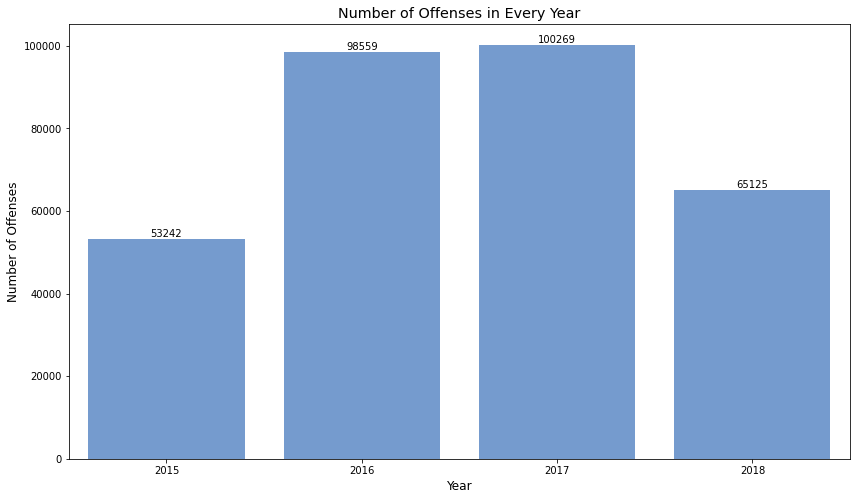

In [121]:
crime_per_year = crimes["Year"].value_counts().sort_values(ascending=False)

plt.figure(figsize=(14,8))
plt.title("Number of Offenses in Every Year", size = "x-large")
ax = sns.barplot(x = crime_per_year.index, y = crime_per_year, color='#69d')
ax.bar_label(ax.containers[0])
plt.xlabel("Year", size = "large")
plt.ylabel("Number of Offenses", size = "large")

The trend of law violations in 2016 and 2017 was higher than in 2015 and 2018. However, 2015 and 2018 did not have the same number of months as 2016 and 2017, so more data on 2015 and 2018 is needed to draw conclusions on the number of law violations in that year.

Total law violations per year based on `Offense_Code_Group` column

In [99]:
fig = px.histogram(crimes, x = "Offense_Code_Group", template="plotly_white", opacity=0.7,
                   animation_frame = "Year", labels={"Offense_Code_Group": "Offense Code Group"},
                title="Top 20 highest crimes June 2015 - September 2018", width=1100, height=1000)
fig.update_layout(xaxis_tickangle=60)
padding_top = 200

fig["layout"]["sliders"][0]["pad"]["t"] = padding_top
fig["layout"]["updatemenus"][0]["pad"]["t"] = padding_top

fig.show()

The most violations of the law every year based on `Offense_Code_Group` are the same, namely `Motor Vehicle Accident Response`.

### Comparing the number of law violations by month

In [100]:
crimes.head()

,Incident_ID,Offense_Code,Offense_Code_Group,Offense_Description,District,Reporting_Area,Shooting,Occurred_On,Year,Month,Day,Hour,UCR,Latitude,Longitude,Month_Name
0,I182070945,619,Larceny,LARCENY ALL OTHERS,Allston & Brighton,808,N,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,42.357791,-71.139371,Sep
1,I182070943,1402,Vandalism,VANDALISM,Dorchester,347,N,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,42.306821,-71.060300,Aug
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,South End,151,N,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,42.346589,-71.072429,Sep
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,South End,272,N,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,42.334182,-71.078664,Sep
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,Mattapan,421,N,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,42.275365,-71.090361,Sep


In [101]:
crimes2 = crimes.copy()
crimes2["Month_Name"] = pd.Categorical(crimes2["Month_Name"], categories=
    ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"],
    ordered = True)
reOrder_month = crimes2["Month_Name"].value_counts()
reOrder_month = reOrder_month.sort_index()
crimemonthly = reOrder_month.to_frame().reset_index()
crimemonthly.columns = ["Month_Name", "Count"]
percentage = []
for i in range(0, 12):
    pct = (crimemonthly["Count"][i] / crimemonthly["Count"].sum()) * 100
    percentage.append(round(pct, 2))
crimemonthly["Percentage"] = percentage
crimemonthly

,Month_Name,Count,Percentage
0,Jan,23515,7.41
1,Feb,21579,6.80
2,Mar,24035,7.58
3,Apr,23993,7.56
4,May,26106,8.23
5,Jun,30367,9.57
6,Jul,34248,10.80
7,Aug,34545,10.89
8,Sep,26324,8.30
9,Oct,25570,8.06


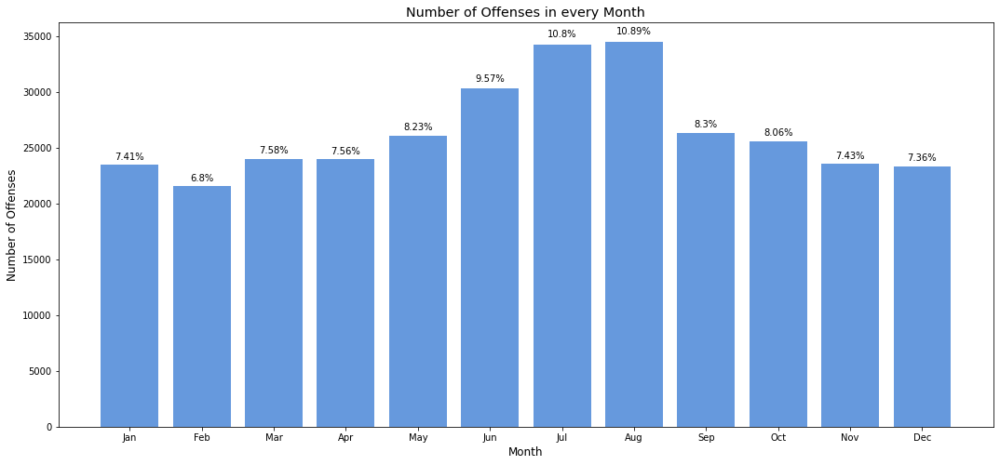

In [127]:
plt.figure(figsize=(18,8))
graph = plt.bar(crimemonthly.Month_Name, crimemonthly.Count, color="#69d")
plt.title("Number of Offenses in every Month", size = "x-large")
i = 0
for p in graph:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    plt.text(x + width / 2,
             y + height * 1.02,
             str(crimemonthly.Percentage[i])+"%",
             ha = "center")
    i += 1
plt.xlabel("Month", size = "large")
plt.ylabel("Number of Offenses", size = "large")
plt.show()

Most of the law violations occurred in August. Keep in mind that there are four times in June - September in the data (2015 - 2018), while the others only three times (January - May only 2016 - 2018 and October - December in 2015 - 2017). Therefore, data from January - May 2015 and October - December 2018 are needed to confirm this. Since the comparison of the number of months is not the same, I will compare the events from July 2015 until June 2018.

In [118]:
crimes3 = crimes.copy()
crimes3 = crimes3.drop(crimes3[(crimes3["Year"] == 2018) & (crimes3["Month"] > 6)].index)
crimes3 = crimes3.drop(crimes3[(crimes3["Year"] == 2015) & (crimes3["Month"] == 6)].index)

In [119]:
crimes3["Month_Name"] = pd.Categorical(crimes3["Month_Name"], categories =
    ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"],
    ordered = True)
reOrder_month2 = crimes3["Month_Name"].value_counts()
reOrder_month2 = reOrder_month2.sort_index()
crimemonthly2 = reOrder_month2.to_frame().reset_index()
crimemonthly2.columns = ["Month_Name", "Count"]
percentage = []
for i in range(0, 12):
    pct = (crimemonthly2["Count"][i] / crimemonthly2["Count"].sum()) * 100
    percentage.append(round(pct, 2))
crimemonthly2["Percentage"] = percentage
crimemonthly2

,Month_Name,Count,Percentage
0,Jan,23515,7.95
1,Feb,21579,7.30
2,Mar,24035,8.13
3,Apr,23993,8.11
4,May,26106,8.83
5,Jun,26238,8.87
6,Jul,25787,8.72
7,Aug,26298,8.89
8,Sep,25709,8.69
9,Oct,25570,8.65


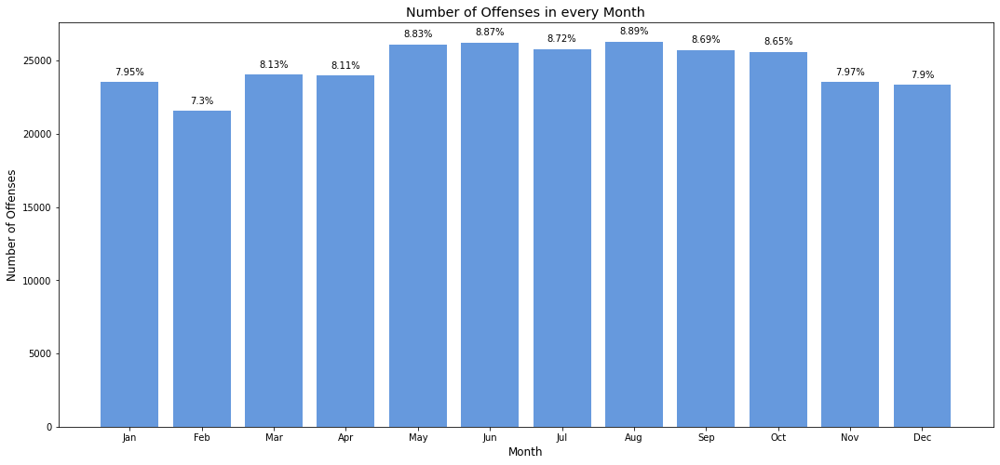

In [128]:
plt.figure(figsize=(18,8))
graph = plt.bar(crimemonthly2.Month_Name, crimemonthly2.Count, color = "#69d")
plt.title("Number of Offenses in every Month", size = "x-large")
i = 0
for p in graph:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    plt.text(x + width / 2,
             y + height * 1.02,
             str(crimemonthly2.Percentage[i])+"%",
             ha = "center")
    i += 1
plt.xlabel("Month", size = "large")
plt.ylabel("Number of Offenses", size = "large")
plt.show()

December, January, and February are the months with the lowest levels of law violations seasonally (Winter). Because in winter, people prefer to stay at home because the temperature is low.

### Comparing the number of law violations by day of occurrence

In [129]:
crimes.Day = pd.Categorical(crimes.Day, 
              categories=["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"],
              ordered=True)
reOrder_day = crimes["Day"].value_counts()
reOrder_day = reOrder_day.sort_index()
crimeday = reOrder_day.to_frame().reset_index()
crimeday.columns = ["Day_Name", "Count"]
percentage = []
for i in range(0,7):
    pct = (crimeday["Count"][i] / crimeday["Count"].sum()) * 100
    percentage.append(round(pct, 2))
crimeday["Percentage"] = percentage
crimeday

,Day_Name,Count,Percentage
0,Monday,45399,14.31
1,Tuesday,46099,14.53
2,Wednesday,46496,14.66
3,Thursday,46372,14.62
4,Friday,48180,15.19
5,Saturday,44570,14.05
6,Sunday,40079,12.64


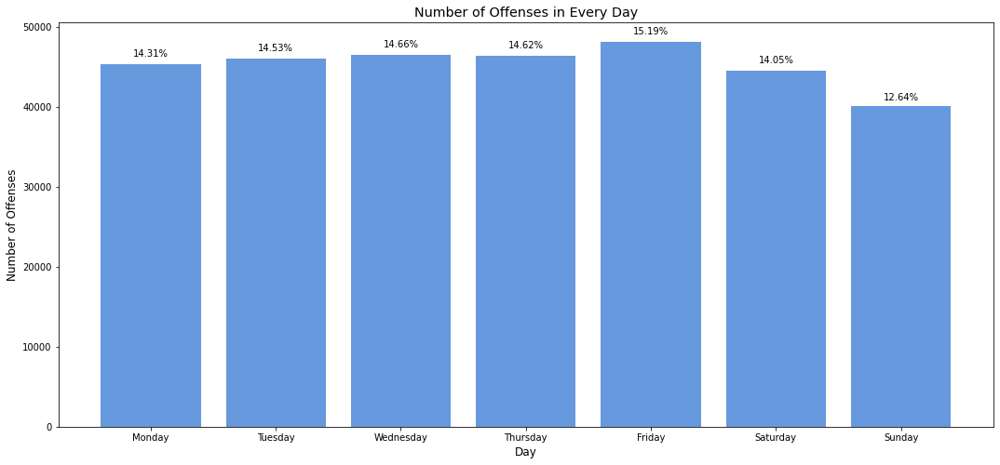

In [130]:
plt.figure(figsize=(18,8))
graph = plt.bar(crimeday.Day_Name, crimeday.Count, color = "#69d")
plt.title("Number of Offenses in Every Day", size = "x-large")
i = 0
for p in graph:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    plt.text(x + width / 2,
             y + height * 1.02,
             str(crimeday.Percentage[i]) + "%",
             ha = "center")
    i += 1
plt.xlabel("Day", size = "large")
plt.ylabel("Number of Offenses", size = "large")
plt.show()

From the graph above, although overall tends to be stable, most violations of the law occurred on Friday. Saturday and Sunday are the days with the fewest violations. Need more complete data and analysis to find out why most events occur on Fridays. Next, check the proportion of hours each day.

### Comparing the number of law violations by time of occurrence

In [131]:
crimehour=crimes.groupby("Hour")["Incident_ID"].count().reset_index()
percentage = []
for i in range(0,24):
    pct = (crimehour["Incident_ID"][i] / crimehour["Incident_ID"].sum())*100
    percentage.append(round(pct, 2))
crimehour["Percentage"] = percentage
crimehour.head()

,Hour,Incident_ID,Percentage
0,0,14968,4.72
1,1,9211,2.90
2,2,7628,2.40
3,3,4557,1.44
4,4,3393,1.07


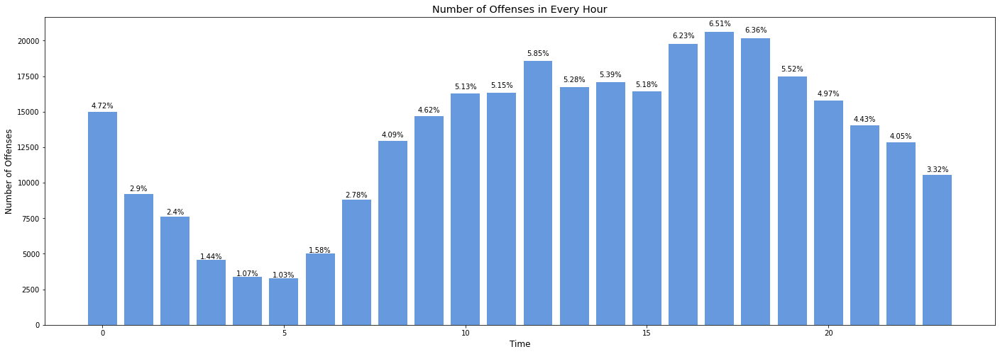

In [134]:
plt.figure(figsize=(24,8))
graph = plt.bar(crimehour.Hour, crimehour.Incident_ID, color = "#69d")
plt.title("Number of Offenses in Every Hour", size = "x-large")
i = 0
for p in graph:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    plt.text(x + width / 2,
             y + height * 1.02,
             str(crimehour.Percentage[i]) + "%",
             ha = "center")
    i += 1
plt.xlabel("Time", size = "large")
plt.ylabel("Number of Offenses", size = "large")
plt.show()

From the graph above, the following conclusions can be drawn.
1. Most violations of the law at 16:00-18:59. It is necessary to look in more detail at the types of violations that occurred to find out if this has anything to do with rush hour where people are tired after a long day at work.
2. At 01:00-7:59 am, violations of the law tends to be low.

Text(0, 0.5, 'Offense Code Group')

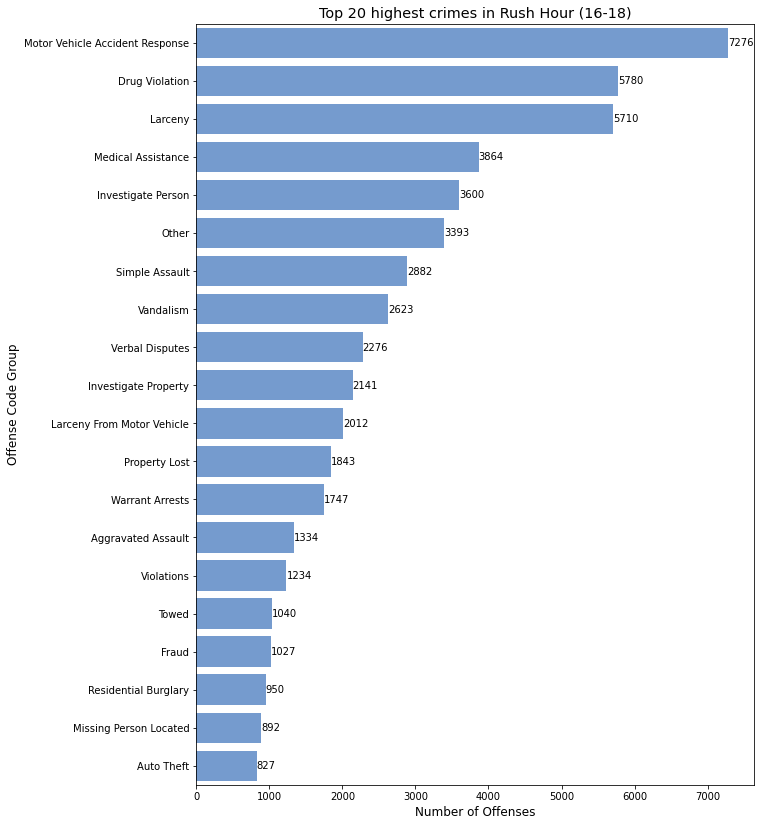

In [142]:
top_20_rush_hour = crimes[(crimes["Hour"] == 16) | (crimes["Hour"] == 17) | (crimes["Hour"] == 18)]["Offense_Code_Group"].value_counts().head(20)

plt.figure(figsize=(10,14))
plt.title("Top 20 highest crimes in Rush Hour (16-18)", size = "x-large")
ax = sns.barplot(x = top_20_rush_hour, y = top_20_rush_hour.index, color='#69d')
ax.bar_label(ax.containers[0])
plt.xlabel("Number of Offenses", size = "large")
plt.ylabel("Offense Code Group", size = "large")

Most of law violations is traffict accident, this is related to working hours.

### District with the most law violations

In [143]:
mostcrimesdistrict = crimes.groupby("District")["Incident_ID"].count().reset_index()
percentage = []
for i in range(0,12):
    pct = (mostcrimesdistrict["Incident_ID"][i] / mostcrimesdistrict["Incident_ID"].sum())*100
    percentage.append(round(pct, 2))
mostcrimesdistrict["Percentage"] = percentage
mostcrimesdistrict

,District,Incident_ID,Percentage
0,Allston & Brighton,20118,6.34
1,Charlestown,6505,2.05
2,Dorchester,42513,13.40
3,Downtown,35708,11.26
4,E18,17339,5.47
5,East Boston,13541,4.27
6,Hyde Park,17530,5.53
7,Mattapan,35428,11.17
8,Roxbury,49924,15.74
9,South Boston,23451,7.39


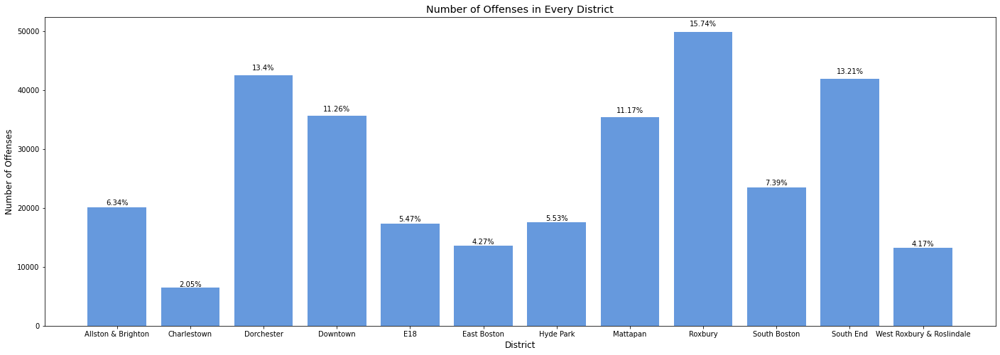

In [146]:
plt.figure(figsize=(24,8))
graph = plt.bar(mostcrimesdistrict.District, mostcrimesdistrict.Incident_ID, color = "#69d")
plt.title("Number of Offenses in Every District", size = "x-large")
i = 0
for p in graph:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    plt.text(x + width / 2,
             y + height * 1.02,
             str(mostcrimesdistrict.Percentage[i]) + "%",
             ha = "center")
    i += 1
plt.xlabel("District", size = "large")
plt.ylabel("Number of Offenses", size = "large")
plt.show()

The three districts with the highest number of law violations are `Roxbury`, `South End`, and `Dorchester` while `Charlestown` is the district with the least number of law violations

### Shooting Incident

In [148]:
shooting_crimes = crimes[crimes["Shooting"] == "Y"]
shooting_crimes.head()

,Incident_ID,Offense_Code,Offense_Code_Group,Offense_Description,District,Reporting_Area,Shooting,Occurred_On,Year,Month,Day,Hour,UCR,Latitude,Longitude,Month_Name
1227,I182069509,413,Aggravated Assault,ASSAULT - AGGRAVATED - BATTERY,E18,540,Y,2018-08-29 23:19:00,2018,8,Wednesday,23,Part One,42.250405,-71.131737,Aug
1788,I182068876,413,Aggravated Assault,ASSAULT - AGGRAVATED - BATTERY,Roxbury,183,Y,2018-08-27 22:56:00,2018,8,Monday,22,Part One,42.321042,-71.072153,Aug
3173,I182067317,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",Roxbury,312,Y,2018-08-22 15:00:00,2018,8,Wednesday,15,Part One,42.315689,-71.089514,Aug
3174,I182067317,2662,Ballistics,BALLISTICS EVIDENCE/FOUND,Roxbury,312,Y,2018-08-22 15:00:00,2018,8,Wednesday,15,Part Two,42.315689,-71.089514,Aug
4010,I182066420,413,Aggravated Assault,ASSAULT - AGGRAVATED - BATTERY,Charlestown,900,Y,2018-08-19 22:46:00,2018,8,Sunday,22,Part One,42.378085,-71.057841,Aug


Shooting incident location using heatmap:

In [97]:
heatmap = folium.Map(location=[42.300351710236614, -71.05797189828955], tiles = "cartodbpositron", zoom_start = 12)

HeatMap(data=  shooting_crimes[["Latitude", "Longitude"]], radius = 10).add_to(heatmap)
heatmap

#### District with most shooting incident

In [149]:
district_shoot = shooting_crimes.groupby("District")["Incident_ID"].count().reset_index()
percentage = []
for i in range(0,12):
    pct = (district_shoot["Incident_ID"][i] / district_shoot["Incident_ID"].sum())*100
    percentage.append(round(pct, 2))
district_shoot["Percentage"] = percentage
district_shoot

,District,Incident_ID,Percentage
0,Allston & Brighton,20,1.98
1,Charlestown,5,0.49
2,Dorchester,186,18.38
3,Downtown,11,1.09
4,E18,34,3.36
5,East Boston,14,1.38
6,Hyde Park,65,6.42
7,Mattapan,221,21.84
8,Roxbury,342,33.79
9,South Boston,39,3.85


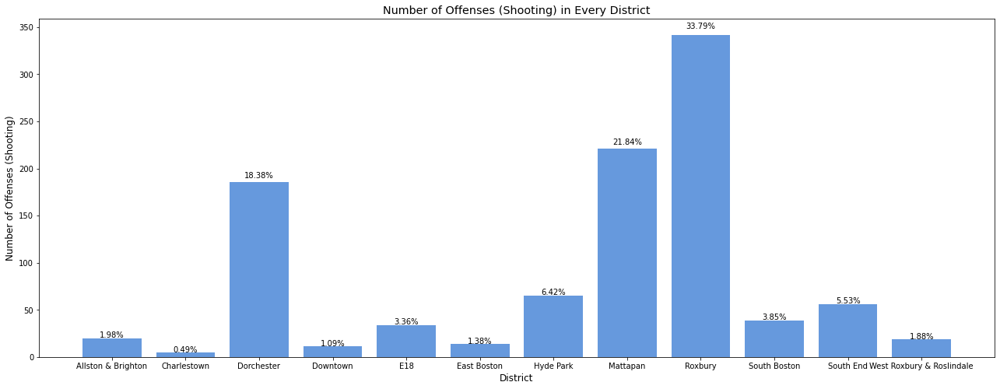

In [160]:
plt.figure(figsize=(22,8))
graph = plt.bar(district_shoot.District, district_shoot.Incident_ID, color = "#69d")
plt.title("Number of Offenses (Shooting) in Every District", size = "x-large")
i = 0
for p in graph:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    plt.text(x + width / 2,
             y + height * 1.02,
             str(district_shoot.Percentage[i]) + "%",
             ha = "center")
    i += 1
plt.xlabel("District", size = "large")
plt.ylabel("Number of Offenses (Shooting)", size = "large")
plt.show()

`Roxbury` is the most dangerous district because it is the district with the most shooting incidents followed by `Mattapan` and `Dorchester`. When viewed from the geographical location, the three are close to each other. Let's see  what time the shooting incident occurred in roxbury.

#### Day with most shooting incident in Roxbury

In [152]:
shooting_crimes_roxbury = shooting_crimes[shooting_crimes["District"] == "Roxbury"]
roxbury_day_shoot = shooting_crimes_roxbury.groupby("Day")["Incident_ID"].count().reset_index()
percentage = []
for i in range(0,7):
    pct = (roxbury_day_shoot["Incident_ID"][i] / roxbury_day_shoot["Incident_ID"].sum())*100
    percentage.append(round(pct, 2))
roxbury_day_shoot["Percentage"] = percentage
roxbury_day_shoot

,Day,Incident_ID,Percentage
0,Monday,52,15.20
1,Tuesday,27,7.89
2,Wednesday,48,14.04
3,Thursday,47,13.74
4,Friday,36,10.53
5,Saturday,92,26.90
6,Sunday,40,11.70


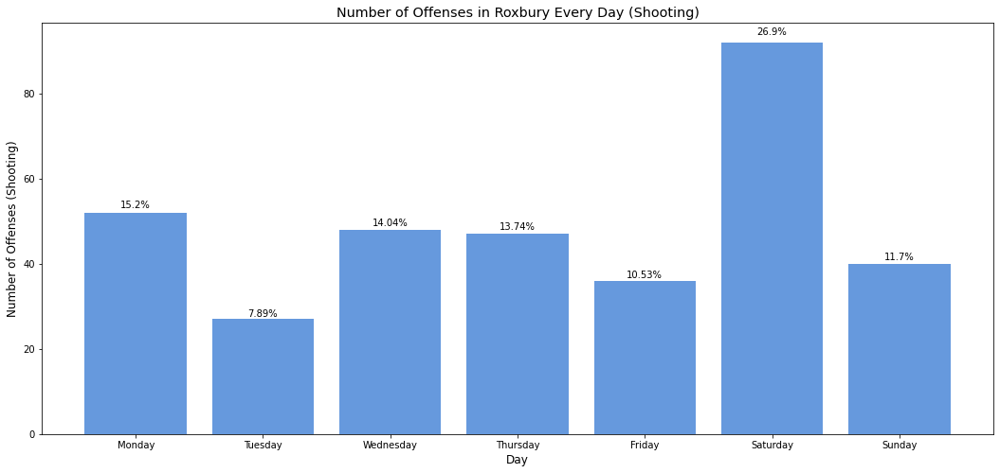

In [158]:
plt.figure(figsize=(18,8))
graph = plt.bar(roxbury_day_shoot.Day, roxbury_day_shoot.Incident_ID, color = "#69d")
plt.title("Number of Offenses in Roxbury Every Day (Shooting)", size = "x-large")
i = 0
for p in graph:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    plt.text(x + width / 2,
             y + height * 1.02,
             str(roxbury_day_shoot.Percentage[i]) + "%",
             ha = "center")
    i += 1
plt.xlabel("Day", size = "large")
plt.ylabel("Number of Offenses (Shooting)", size = "large")
plt.show()

From the graph above, Saturday is the day with the most shooting incidents

#### Time with most shooting incident in Roxbury

In [163]:
roxbury_hour_shoot = shooting_crimes_roxbury.groupby("Hour")["Incident_ID"].count().reset_index()
percentage = []
for i in range(0,21):
    pct = (roxbury_hour_shoot["Incident_ID"][i] / roxbury_hour_shoot["Incident_ID"].sum())*100
    percentage.append(round(pct, 2))
roxbury_hour_shoot["Percentage"] = percentage
roxbury_hour_shoot.head()

,Hour,Incident_ID,Percentage
0,0,40,11.70
1,1,8,2.34
2,2,18,5.26
3,3,4,1.17
4,4,4,1.17


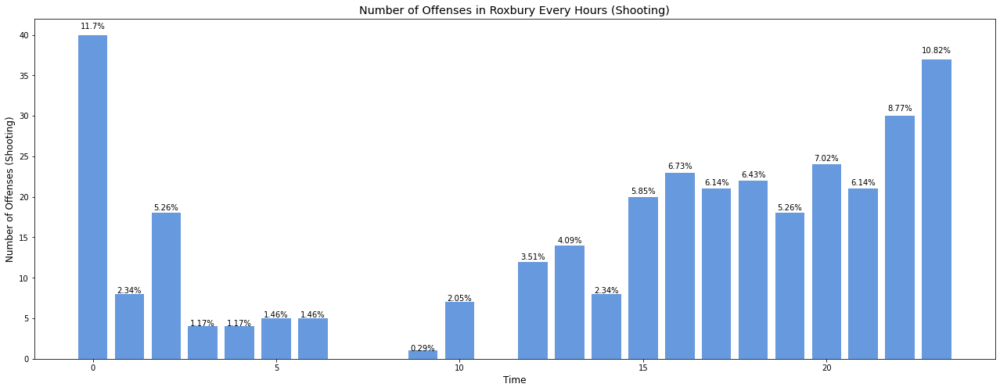

In [166]:
plt.figure(figsize=(22,8))
graph = plt.bar(roxbury_hour_shoot.Hour, roxbury_hour_shoot.Incident_ID, color = "#69d")
plt.title("Number of Offenses in Roxbury Every Hours (Shooting)", size = "x-large")
i = 0
for p in graph:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    plt.text(x + width / 2,
             y + height * 1.02,
             str(roxbury_hour_shoot.Percentage[i]) + "%",
             ha = "center")
    i += 1
plt.xlabel("Time", size = "large")
plt.ylabel("Number of Offenses (Shooting)", size = "large")
plt.show()

In every years, the 3 highest shooting incidents in `Roxbury` were at 10.00 PM - 00.59 AM with the highest at 00.00 AM.

## **5. Conclusion and Recommendations**

### **5.1 Conclusion**

1. `Motor Vehicle Accident Response` became` Offense_Code_Group` which most often occurred in the period June 2015 to September 2018.
2. The number of violations from july 2015 - june 2018 tends to be the same every month except in winter.
3. The highest category of law violations is always the same every year, namely `Motor Vehicle Accident Response`.
4. Most of the law violations occurred on `Fridays`.
5. Most law violations occur at 16:00-18:59 with category of law violations is `Motor Vehicle Accident Response`.
6. The district with the most cases is in `Roxbury`.
7. `Roxbury` is the most dangerous district because it is the district with the most shooting incidents followed by `Mattapan` and `Dorchester`. When viewed from the geographical location, the three are close to each other.
8. `Saturday` is the day with the most shooting incidents in Roxbury.
9. The 3 time highest shooting incidents in `Roxbury` were at `10.00` PM - `00.59` AM with the highest at `00.00` AM.
10. Even though this dataset happened from 2015 - 2018, if we calculate it cleanly, it's only 3 years old due to lack of data.

### **5.2 Recommendation**

1. It is necessary to increase patrols on the highway because when viewed from the data, `Motor Vehicle Accident Response` is the most common every year from June 2015 to September 2018.
2. The police have to increase their personnel `outside of winter` because the number of cases every month (except winter) is almost the same.
3. `Friday` was a busier day than any other day for Boston PD. Therefore, sufficient police officers are needed to secure the Boston area.
4. Shift changes are not carried out during peak hours, especially between 4 pm and 8 pm. It is better to do it in the morning when the hour has the fewest cases of lawlessness.
5. `Roxbury` needs to have more police because it has the most cases of lawlessness and the most shooting incident compared to other districts.
6. `Saturday` is the day with the most shooting incidents in `Roxbury`, so the police need to increase patrols in the district especially at `night` to prevent law violations.
7. Socialization to people can even start from the children at school, that any act of violating the law will permanently damage the lives of the perpetrators and victims. The victim may get PTSD (Post-Traumatic Stress Disorder), anxiety, or any consequence of the incident. As for the perpetrators, the clean record is damaged by the existence of a record of the violation committed. This will affect a person's chances of getting a job or other normal lives because of a record of violating the law.